# Urban Airscape: Determinants of Air Quality in City Environments

## 1. Project Overview

Air pollution has become a growing concern for public health, with recent years showing an alarming rise in pollution levels. This increase is attributed to both natural events, such as wildfires, and human activities like land-use changes and agriculture-driven fires, transportation and industries. Among these, human-induced pollutants have been extensively studied for their detrimental effects on air quality. Air pollution has increasingly become a significant public health concern, with recent years witnessing a worrying rise in pollution levels. These human-induced pollutants stem from sources like land-use changes, agriculture-driven fires, transportation, industrial manufacturing, energy production, and residential heating. Among these, the impact of human-induced pollutants has been particularly detrimental to air quality, with key pollutants including carbon monoxide (CO), nitrogen oxides (NOx), volatile organic compounds (VOCs), and particulate matter (PM).

For instance, carbon monoxide (CO) is primarily emitted from vehicle exhaust and incomplete combustion in industrial processes. Nitrogen oxides (NOx), which include nitrogen dioxide (NO2), are released during high-temperature combustion in power plants, automobiles, and ships. Non-methane hydrocarbons (NMHCs) and benzene (C6H6) originate from motor vehicles, industrial activities, and the evaporation of organic solvents. Ozone (O3), although not directly emitted, is a secondary pollutant formed when NOx and VOCs interact with sunlight in the atmosphere, contributing to ground-level ozone, a key component of smog.

Each of these pollutants is associated with different sectors:

CO is predominantly emitted through vehicle exhaust and poorly ventilated combustion sources like heaters.
NOx emissions come from the burning of fossil fuels in cars, trucks, power plants, and construction equipment.
NMHCs and C6H6 are byproducts of the combustion of fossil fuels and evaporation from chemical production or fuel storage.
Ozone (O3) forms when NOx and VOCs undergo chemical reactions in the presence of sunlight, mainly due to industrial emissions and vehicular traffic.
These pollutants (such as CO, NOx, NMHCs, and O3) severely degrade air quality, leading to respiratory problems, cardiovascular diseases, and long-term environmental harm. As industrialization and urbanization continue to expand globally, controlling these emissions becomes increasingly vital for safeguarding public health.

This study is based on a real-world dataset used in a data science job interview. The project demonstrates key techniques including:
 - missing data handling
 - outlier treatment 
 - dimensionality reduction 
 - regression model construction
 - model evaluation

The goal is to analyze how various air pollutants and environmental factors are related to the concentration of **PT08.S1 (CO)**, which measures carbon monoxide (CO) levels in the atmosphere. By investigating the contributions of other pollutants and environmental variables, such as temperature and humidity, the study aims to identify the primary drivers of CO pollution. This insight can inform strategies for improving air quality and public health outcomes.


## 1.1. Data Description
The dataset contains 9,358 averaged measurements from 5 chemical sensors of a multisensor device (PTXX.SX). This device was positioned at street level in a heavily polluted city. The data was collected over the course of one year, from March 2004 to February 2005. Missing values are marked with -200. In addition to the chemical sensor data, some environmental variables were also recorded, such as humidity, absolute humidity and temperature. 

## 1.2. Variables Description
1. **Date (DD/MM/YYYY)**: The date of the measurement in day/month/year format.
2. **Time (HH.MM.SS)**: The time of the measurement in hours.minutes.seconds format.
3. **PT08.S1 (CO)**: The concentration of carbon monoxide (CO) in the atmosphere, which is the target variable.
4. **Non-Methane Hydrocarbons (NMHC) Concentration (mg/m^3)**: The concentration of non-methane hydrocarbons, which are volatile organic compounds (VOCs) other than methane.
5. **Benzene Concentration (mg/m^3)**: The concentration of benzene, a harmful volatile organic compound (VOC).
6. **PT08.S2 (NMHC)**: The second sensor’s response related to non-methane hydrocarbons.
7. **NOx Concentration (ppb)**: The concentration of nitrogen oxides (NO and NO2), common air pollutants.
8. **PT08.S3 (NOx)**: The third sensor’s response related to nitrogen oxides.
9. **NO2 Concentration (mg/m^3)**: The concentration of nitrogen dioxide, another harmful air pollutant.
10. **PT08.S4 (NO2)**: The fourth sensor’s response related to nitrogen dioxide.
11. **PT08.S5 (O3)**: The fifth sensor’s response related to ozone (O3).
12. **Temperature (C)**: The ambient temperature, recorded in degrees Celsius.
13. **Relative Humidity (%)**: The percentage of moisture in the air relative to the maximum possible.
14. **Absolute Humidity (AH)**: The total amount of water vapor in the air, regardless of temperature, measured in grams per cubic meter.


## 1.3. Project Objectives

This project aims to address the following key questions:

a) **When** are polluent concentrations highest?  
   - Specifically, where the CO concentrations are the highest? 
   - This includes analyzing the hours, days, weeks, and months of the year with the highest recorded concentrations of CO.

b) **What** is the relationship between CO concentrations and other factors?  
   - Specifically, how do other air pollutants and environmental variables such as temperature and humidity, impact the concentration of **PT08.S1 (CO)**?

## 2. Importing libraries

In [1]:
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import calendar 
%matplotlib inline
from matplotlib import style
style.use('ggplot')
from warnings import filterwarnings
filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (8,6)

## 2.1. Importing auxiliary functions 

In [2]:
def create_summary(x):
    """
    Generate a summary of key statistics for a given numeric column in a DataFrame.

    Parameters:
    - x: Input column (Series).

    Returns:
    - A Series with various summary statistics (count, missing values, sum, mean, median, 
      standard deviation, variance, min, percentiles, max).
    """
    numeric_df = df.select_dtypes(include=[np.number])
        
        # Step 2: Initialize an empty dictionary to hold the summary data
    summary_dict = {
            'column': [],
            'mean': [],
            'std_dev': [],
            'min': [],
            'max': [],
            'median': []
    }
        
        # Step 3: Loop over each numeric column and generate summary statistics
    for column in numeric_df.columns:
            summary_dict['column'].append(column)
            summary_dict['mean'].append(numeric_df[column].mean())
            summary_dict['std_dev'].append(numeric_df[column].std())
            summary_dict['min'].append(numeric_df[column].min())
            summary_dict['max'].append(numeric_df[column].max())
            summary_dict['median'].append(numeric_df[column].median())
        
        # Step 4: Convert the dictionary into a DataFrame
    summary_df = pd.DataFrame(summary_dict)
        
    return summary_df


In [3]:
def plot_histogram_grid(df, variables, rows=2, cols=4):
    """
    Plot a grid of histograms for the specified variables with vertical lines for the mean and median.
    Handles missing values by excluding them from calculations.
    
    Parameters:
    df (pandas.DataFrame): The input DataFrame.
    variables (list): List of variable names (columns) to plot.
    rows (int): Number of rows in the grid.
    cols (int): Number of columns in the grid.
    
    Returns:
    None: Displays the plot.
    """

    fig, axes = plt.subplots(rows, cols, figsize=(16, 8))
    axes = axes.flatten() 
    sns.set(style="whitegrid") 

   
    for i, var in enumerate(variables):
        
        data = pd.to_numeric(df[var], errors='coerce').dropna()  


        mean_val = data.mean()
        median_val = data.median()

  
        sns.histplot(data, bins=30, kde=False, ax=axes[i], color='skyblue', edgecolor='black')

       
        axes[i].axvline(mean_val, color='tomato', linestyle='--', linewidth=2, label='Mean')
        axes[i].axvline(median_val, color='green', linestyle='-', linewidth=2, label='Median')

 
        axes[i].set_title(var, fontsize=12)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')


        axes[i].legend(loc='best')

 
    for ax in axes[len(variables):]:
        ax.remove()

    plt.tight_layout()
    plt.show()


In [4]:
def count_outliers_iqr(df, columns):
    """
    Count the number of outliers in each specified column using the IQR method.
    
    Parameters:
    df (pandas.DataFrame): The input DataFrame.
    columns (list): List of column names to check for outliers.
    
    Returns:
    dict: A dictionary with column names as keys and the number of outliers as values.
    """
    outlier_counts = {}
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outlier_counts[col] = outliers.shape[0]
    return outlier_counts

In [5]:
def corrMat(df):
    """
    Generate a correlation heatmap for the numeric columns of a DataFrame, 
    with columns renamed to title case and underscores replaced by spaces.

    Parameters:
    - df: Input DataFrame.

    Returns:
    - Displays and saves a heatmap of the correlation matrix.
    """

    numeric_df = df.select_dtypes(include=[np.number])
    renamed_columns = {col: col.replace('_', ' ').title() for col in numeric_df.columns}
    numeric_df = numeric_df.rename(columns=renamed_columns)
    
    
    corr_mat = numeric_df.corr().round(2)
    

    sns.set(style="white")
    f, ax = plt.subplots(figsize=(6, 6))
    

    mask = np.zeros_like(corr_mat, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    

    sns.heatmap(
        corr_mat, 
        mask=mask, 
        vmin=-1, 
        vmax=1, 
        center=0, 
        cmap='coolwarm', 
        square=False, 
        lw=2, 
        annot=True, 
        cbar=True, 
        annot_kws={"size": 8, "weight": "bold"}
    )
    

    plt.title('Polluent Concentration Correlation Heatmap')


    figures_dir = os.path.join(os.pardir, "EDA_results", "figures")
    if not os.path.exists(figures_dir):
        os.makedirs(figures_dir)

    plt.savefig(os.path.join(figures_dir, 'correlation_heatmap.png'), dpi=300)
    plt.show()
    plt.close()

In [6]:
def missing_values_summary(df):
    """
    Function to calculate and return the count and percentage of missing values for each column in a DataFrame.
    
    Parameters:
    df (pandas.DataFrame): The input DataFrame to check for missing values.
    
    Returns:
    pandas.DataFrame: A DataFrame with the count and percentage of missing values for each column.
    """
 
    count_missing = df.isnull().sum()

  
    percent_missing = round((count_missing / len(df)) * 100, 2)

 
    missing_values = pd.concat([percent_missing, count_missing], axis=1, 
                               keys=['Percent_of_Missing_Values', 'Count_of_Missing_Values'])
    
    return missing_values

In [7]:
def iqr_transform(df):
    """
    Apply IQR transformation to limit outliers in numeric columns.
    
    Parameters:
    df (pandas.DataFrame): The input DataFrame.
    
    Returns:
    pandas.DataFrame: A DataFrame with outliers replaced by upper and lower bounds defined by the IQR method.
    """
    
    df_num = df.copy()

    for col in df_num.select_dtypes(include='number').columns:
      
        Q1 = df_num[col].quantile(0.25)
        Q3 = df_num[col].quantile(0.75)
        

        IQR = Q3 - Q1
        
 
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
  
        df_num[col] = df_num[col].clip(lower=lower_bound, upper=upper_bound)

    return df_num

In [8]:
def plot_pollutant_variations(df, pollutants, peak_hours, ylabel='Concentration'):
    """
    Plots pollutant concentration variations by hour, month, and day of the week for multiple pollutants.
    
    Parameters:
    df (DataFrame): Input DataFrame containing pollutant data.
    pollutants (list): List of pollutant column names to plot.
    peak_hours (dict): A dictionary mapping pollutants to their peak hour.
    ylabel (str, optional): Y-axis label. Default is 'Concentration'.
    """
    
    df['Time'] = pd.to_datetime(df['Time'], format='%H.%M.%S', errors='coerce')
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

    for pollutant in pollutants:
        df[pollutant] = pd.to_numeric(df[pollutant], errors='coerce')

    df = df[['Time', 'Date'] + pollutants].dropna()

    colors = sns.color_palette("husl", len(pollutants))

    for idx, pollutant in enumerate(pollutants):
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))
        fig.suptitle(f'Pollutant: {pollutant}', fontsize=20)

        # Hourly Variation
        df['Hour'] = df['Time'].dt.hour
        hourly_data = df.groupby('Hour')[pollutant].agg(['max', 'std']).reset_index()  # Change to max
        axes[0].plot(hourly_data['Hour'], hourly_data['max'], color=colors[idx], linewidth=2)
        axes[0].fill_between(hourly_data['Hour'], 
                             hourly_data['max'] - hourly_data['std'], 
                             hourly_data['max'] + hourly_data['std'], 
                             color=colors[idx], alpha=0.3)
        axes[0].set_title('Hourly Variation', fontsize=16)
        axes[0].set_xlabel('Hour', fontsize=14)
        axes[0].set_ylabel(ylabel, fontsize=14)
        axes[0].set_xticks(np.arange(0, 24, 1))

        # Mark the peak hour
        if pollutant in peak_hours:
            peak_hour = peak_hours[pollutant]
            axes[0].axvline(x=peak_hour, color='red', linestyle='--', label='Peak Hour', linewidth=2)
            axes[0].legend()

        # Monthly Variation
        df['Month'] = df['Date'].dt.month
        month_data = df.groupby('Month')[pollutant].agg(['max', 'std']).reset_index()
        axes[1].plot(month_data['Month'], month_data['max'], color=colors[idx], linewidth=2)
        axes[1].fill_between(month_data['Month'], 
                             month_data['max'] - month_data['std'], 
                             month_data['max'] + month_data['std'], 
                             color=colors[idx], alpha=0.3)
        axes[1].set_title('Monthly Variation', fontsize=16)
        axes[1].set_xlabel('Month', fontsize=14)
        axes[1].set_xticks(np.arange(1, 13, 1))
        axes[1].set_xticklabels(['jan', 'feb', 'mar', 'apr', 'may', 'jun',
                                 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], fontsize=12)

        # Weekly Variation
        df['DayOfWeek'] = df['Date'].dt.dayofweek
        week_data = df.groupby('DayOfWeek')[pollutant].agg(['max', 'std']).reset_index()
        axes[2].plot(week_data['DayOfWeek'], week_data['max'], color=colors[idx], linewidth=2)
        axes[2].fill_between(week_data['DayOfWeek'], 
                             week_data['max'] - week_data['std'], 
                             week_data['max'] + week_data['std'], 
                             color=colors[idx], alpha=0.3)
        axes[2].set_title('Weekly Variation', fontsize=16)
        axes[2].set_xlabel('Day of Week', fontsize=14)
        axes[2].set_xticks(np.arange(0, 7, 1))
        axes[2].set_xticklabels(['mon', 'tue', 'wed', 'thu', 'fri', 'sat', 'sun'], fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

In [9]:
def analyze_pollutant_concentrations(df, pollutants):
    """
    Analyze pollutant concentrations by hour, month, and day of the week.
    
    This function groups pollutant data based on the hour of the day, month of the year, 
    and day of the week, and calculates statistics such as mean, median, and max concentrations. 
    It returns a DataFrame with the time points (hour, month, weekday) with the highest 
    concentrations for each pollutant, along with mean, median, and max values.
    
    Parameters:
    df (pandas.DataFrame): The input DataFrame containing 'Time', 'Date', and pollutant columns.
    pollutants (list): List of pollutant column names to analyze.
    
    Returns:
    pd.DataFrame: A DataFrame containing the highest concentration time points and their 
                  respective statistics (mean, median, max) for each pollutant.
    """
    
    # Ensure 'Time' and 'Date' are in datetime format
    if not pd.api.types.is_datetime64_any_dtype(df['Time']):
        df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce')
        
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

    # Convert pollutant columns to numeric, coercing non-numeric values to NaN
    for pollutant in pollutants:
        df[pollutant] = pd.to_numeric(df[pollutant], errors='coerce')

    # Drop rows with NaN values in 'Time', 'Date', or pollutants
    df = df[['Time', 'Date'] + pollutants].dropna()

    # Extract useful time features
    df['Hour'] = df['Time'].dt.hour
    df['Month'] = df['Date'].dt.month
    df['Weekday'] = df['Date'].dt.weekday

    # Initialize a list to store the results
    results = []

    # Month and Weekday maps
    month_map = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 
                 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
    weekday_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 
                   4: 'Friday', 5: 'Saturday', 6: 'Sunday'}

    for pollutant in pollutants:
        # Hourly statistics
        hourly_stats = df.groupby('Hour')[pollutant].agg(['mean', 'median', 'max']).reset_index()
        peak_hour = hourly_stats.loc[hourly_stats['max'].idxmax()]
        
        # Monthly statistics
        monthly_stats = df.groupby('Month')[pollutant].agg(['mean', 'median', 'max']).reset_index()
        peak_month = monthly_stats.loc[monthly_stats['max'].idxmax()]
        
        # Weekly statistics
        weekly_stats = df.groupby('Weekday')[pollutant].agg(['mean', 'median', 'max']).reset_index()
        peak_weekday = weekly_stats.loc[weekly_stats['max'].idxmax()]
        
        # Append the result as a dictionary (to be converted into a DataFrame later)
        results.append({
            'Pollutant': pollutant,
            'Highest Hour': f"{int(peak_hour['Hour']):02}:00",
            'Hour Mean Concentration': round(peak_hour['mean'], 2),
            'Hour Max Concentration': round(peak_hour['max'], 2),
            'Hour Median Concentration': round(peak_hour['median'], 2),
            'Highest Month': month_map[peak_month['Month']],
            'Month Mean Concentration': round(peak_month['mean'], 2),
            'Month Max Concentration': round(peak_month['max'], 2),
            'Month Median Concentration': round(peak_month['median'], 2),
            'Highest Weekday': weekday_map[peak_weekday['Weekday']],
            'Weekday Mean Concentration': round(peak_weekday['mean'], 2),
            'Weekday Max Concentration': round(peak_weekday['max'], 2),
            'Weekday Median Concentration': round(peak_weekday['median'], 2)
        })

    # Convert the results list to a pandas DataFrame
    result_df = pd.DataFrame(results)

    return result_df


## 2.2. Data importing

In [10]:
df = pd.read_csv("../data/AirQuality.csv", sep=";")

## 3. Exploratory Data Analysis (EDA)

In [11]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN


In [12]:
df.shape

(9471, 17)

In [13]:
df.describe()

,PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),Unnamed: 15,Unnamed: 16
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,0.0,0.0
mean,1048.990061,-159.090093,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,NaN,NaN
std,329.832710,139.789093,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,NaN,NaN
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,NaN,NaN
25%,921.000000,-200.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,NaN,NaN
50%,1053.000000,-200.000000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,NaN,NaN
75%,1221.000000,-200.000000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,NaN,NaN
max,2040.000000,1189.000000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,NaN,NaN


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(7)
memory usage: 1.2+ MB


In [15]:
# Specify columns to convert to float
cols_to_convert = df.columns.difference(['Date', 'Time'])

# Replace commas with periods and convert to float
for col in cols_to_convert:
    df[col] = df[col].astype(str).str.replace(',', '.')
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Check the DataFrame types and display it
print(df.dtypes)
print(df)

Date              object
Time              object
CO(GT)           float64
PT08.S1(CO)      float64
NMHC(GT)         float64
C6H6(GT)         float64
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                float64
RH               float64
AH               float64
Unnamed: 15      float64
Unnamed: 16      float64
dtype: object
            Date      Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0     10/03/2004  18.00.00     2.6       1360.0     150.0      11.9   
1     10/03/2004  19.00.00     2.0       1292.0     112.0       9.4   
2     10/03/2004  20.00.00     2.2       1402.0      88.0       9.0   
3     10/03/2004  21.00.00     2.2       1376.0      80.0       9.2   
4     10/03/2004  22.00.00     1.6       1272.0      51.0       6.5   
...          ...       ...     ...          ...       ...       ...   
9466         NaN       NaN     NaN          NaN       NaN       

In [16]:
df.dtypes

Date              object
Time              object
CO(GT)           float64
PT08.S1(CO)      float64
NMHC(GT)         float64
C6H6(GT)         float64
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                float64
RH               float64
AH               float64
Unnamed: 15      float64
Unnamed: 16      float64
dtype: object

In [17]:
create_summary(df)

,column,mean,std_dev,min,max,median
0,CO(GT),-34.207524,77.657170,-200.0,11.900,1.5000
1,PT08.S1(CO),1048.990061,329.832710,-200.0,2040.000,1053.0000
2,NMHC(GT),-159.090093,139.789093,-200.0,1189.000,-200.0000
3,C6H6(GT),1.865683,41.380206,-200.0,63.700,7.9000
4,PT08.S2(NMHC),894.595276,342.333252,-200.0,2214.000,895.0000
5,NOx(GT),168.616971,257.433866,-200.0,1479.000,141.0000
6,PT08.S3(NOx),794.990168,321.993552,-200.0,2683.000,794.0000
7,NO2(GT),58.148873,126.940455,-200.0,340.000,96.0000
8,PT08.S4(NO2),1391.479641,467.210125,-200.0,2775.000,1446.0000
9,PT08.S5(O3),975.072032,456.938184,-200.0,2523.000,942.0000


## 3.1. Handling missing data

In [18]:
missing_values_summary(df)

,Percent_of_Missing_Values,Count_of_Missing_Values
Date,1.2,114
Time,1.2,114
CO(GT),1.2,114
PT08.S1(CO),1.2,114
NMHC(GT),1.2,114
C6H6(GT),1.2,114
PT08.S2(NMHC),1.2,114
NOx(GT),1.2,114
PT08.S3(NOx),1.2,114
NO2(GT),1.2,114


<Axes: >

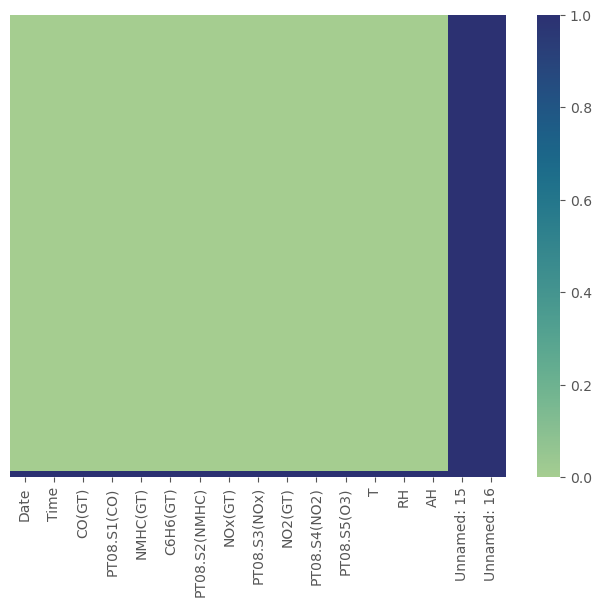

In [19]:
sns.heatmap(df.isna(), yticklabels=False, cmap = 'crest')

From the initial data summary and heatmap analysis, we observe that two columns `Unnamed: 15` and `Unnamed: 16` contain only null values. The remaining columns have some missing values, with a consistent tail of 114 null entries across these columns.


In [20]:
df.tail(115)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
9356,04/04/2005,14.00.00,2.2,1071.0,-200.0,11.9,1047.0,265.0,654.0,168.0,1129.0,816.0,28.5,13.1,0.5028,NaN,NaN
9357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9360,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The columns `Unnamed: 15` and `Unnamed: 16` contain entirely null values. Since there is no prior information on their relevance, I chose to remove these columns entirely from the dataset.

In [21]:
df.drop(columns=['Unnamed: 15', 'Unnamed: 16'],inplace=True)

In [22]:
missing_values_summary(df)

,Percent_of_Missing_Values,Count_of_Missing_Values
Date,1.2,114
Time,1.2,114
CO(GT),1.2,114
PT08.S1(CO),1.2,114
NMHC(GT),1.2,114
C6H6(GT),1.2,114
PT08.S2(NMHC),1.2,114
NOx(GT),1.2,114
PT08.S3(NOx),1.2,114
NO2(GT),1.2,114


Without context provided by the `Date` and `Time` variables, imputing the missing values in the dataset becomes more challenging. However, since the missing values account for only 1.2% of the entire dataset, we can reasonably conclude that removing them will not result in a significant loss of information.

In [23]:
df.dropna(inplace=True)

After removing the missing values from the dataset, we will have this:

<Axes: >

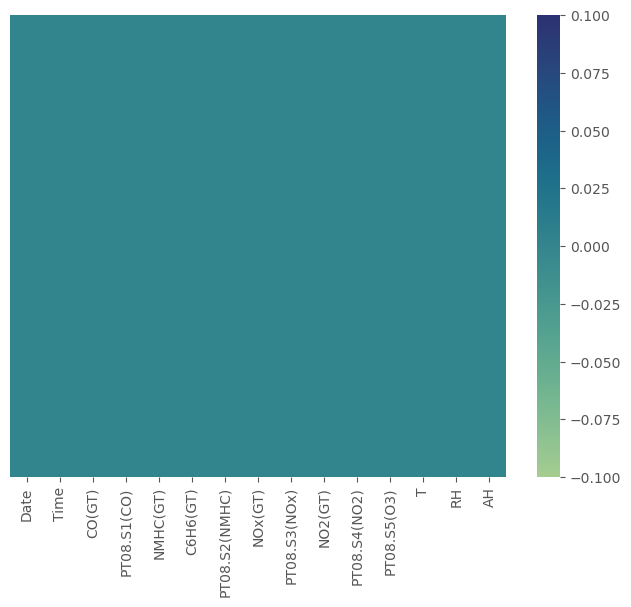

In [24]:
sns.heatmap(df.isna(), yticklabels=False, cmap = 'crest')

In this dataset, missing values are represented by `-200`, as noted in the data description. Therefore, we must account for both these placeholder values and the actual missing entries. 

In [25]:
df.replace(to_replace=-200,value=np.nan,inplace=True)

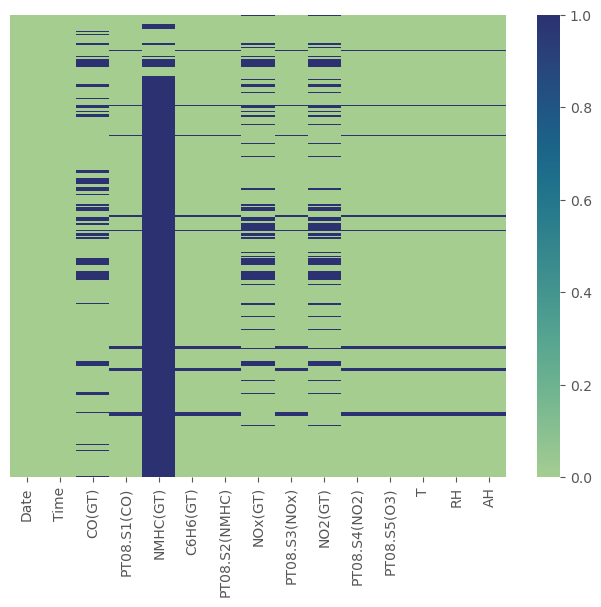

In [26]:
sns.heatmap(df.isna(),yticklabels=False,cmap='crest')
plt.show()

In [27]:
missing_values_summary(df)

,Percent_of_Missing_Values,Count_of_Missing_Values
Date,0.00,0
Time,0.00,0
CO(GT),17.99,1683
PT08.S1(CO),3.91,366
NMHC(GT),90.23,8443
C6H6(GT),3.91,366
PT08.S2(NMHC),3.91,366
NOx(GT),17.52,1639
PT08.S3(NOx),3.91,366
NO2(GT),17.55,1642


In [28]:
print(df.columns)


Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')


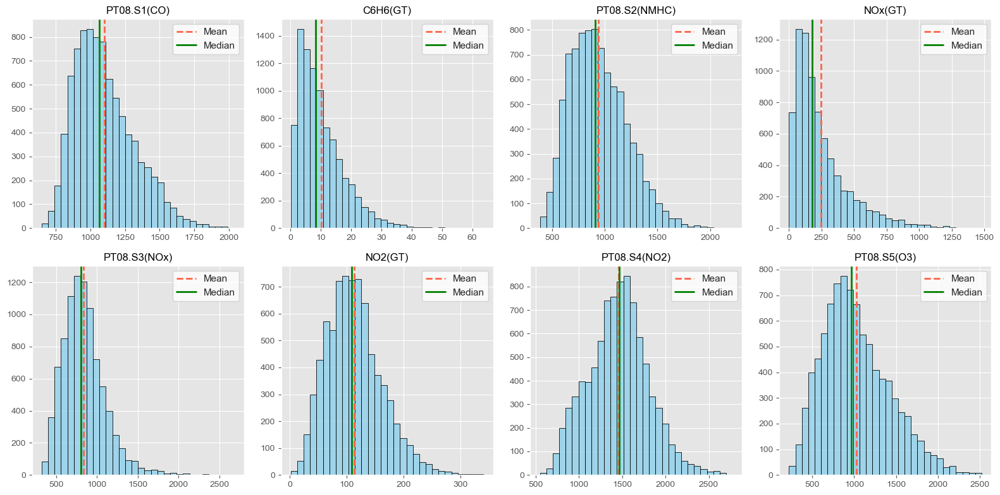

In [29]:
variables = ['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 
             'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
plot_histogram_grid(df, variables)

Given the summary of missing data and the distribution of our numeric features we will handle the missing data as the following:

**Removal of `NMHC(GT)`**: Since `NMHC(GT)` has over 90% missing data, we chose to remove this column entirely from our analysis. Imputing such a large proportion of missing data could lead to unreliable results.
  
**Handling the remaining missing values**: For the remaining variables, the missing values range from 3.91% to 17.5%. Given the manageable proportions and the skewness observed in some distributions, we decided to impute the missing values using the **median** for each variable

In [30]:
df.drop(columns=['NMHC(GT)'],inplace=True)

In [31]:
columns_to_fill = ['PT08.S1(CO)', 'CO(GT)', 'T', 'RH', 'AH','C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 
                   'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

for col in columns_to_fill:
    median_val = df[col].median()  
    df[col].fillna(median_val, inplace=True)  

missing_values_summary(df)

,Percent_of_Missing_Values,Count_of_Missing_Values
Date,0.0,0
Time,0.0,0
CO(GT),0.0,0
PT08.S1(CO),0.0,0
C6H6(GT),0.0,0
PT08.S2(NMHC),0.0,0
NOx(GT),0.0,0
PT08.S3(NOx),0.0,0
NO2(GT),0.0,0
PT08.S4(NO2),0.0,0


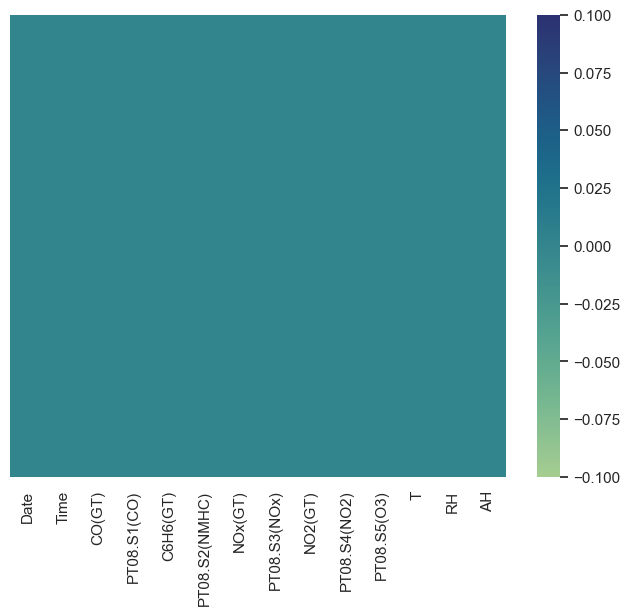

In [32]:
sns.heatmap(df.isna(),yticklabels=False,cmap='crest')
plt.show()

Now we don't have any missing values in our features!

In [33]:
df_num = df.select_dtypes(include=['number']).copy()

In [34]:
df_num.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [35]:
df_num.dtypes

CO(GT)           float64
PT08.S1(CO)      float64
C6H6(GT)         float64
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                float64
RH               float64
AH               float64
dtype: object

In [36]:
target_dir = os.path.join(os.pardir, "EDA_results", "tables")

if not os.path.exists(target_dir):
    os.makedirs(target_dir)


df_num.to_csv(os.path.join(target_dir, 'df_num.csv'), index=False)

print(f"DataFrame saved in: {os.path.abspath(target_dir)}")

DataFrame saved in: c:\Users\luizs\OneDrive\Área de Trabalho\Data Science\Data Science Portfolio\PED EDA CASES\Air Quality\EDA_results\tables


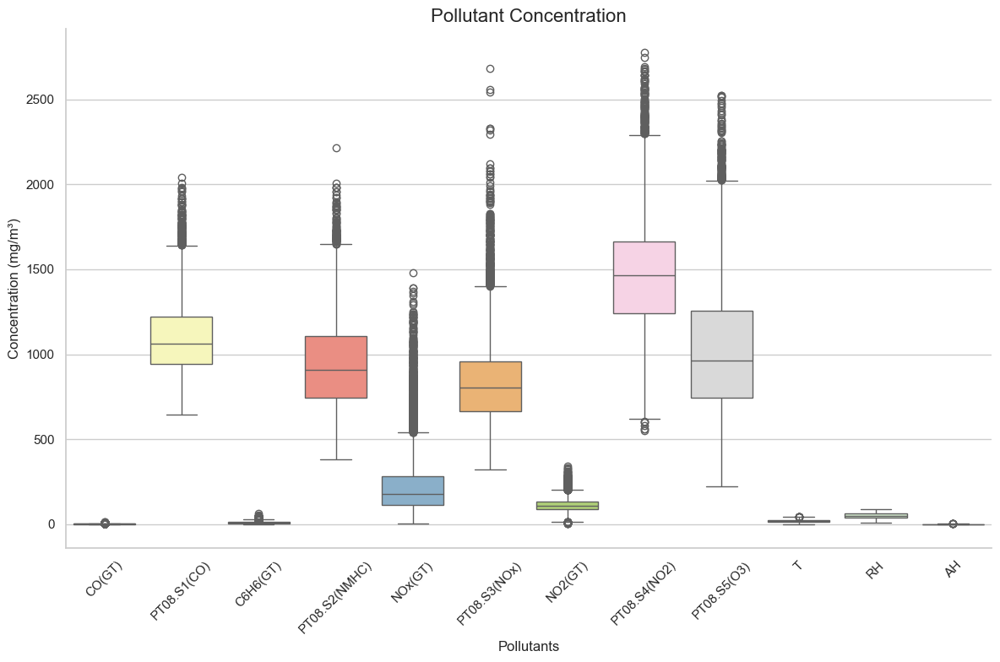

In [37]:
figures_dir = os.path.join(os.pardir, "EDA_results", "figures")
if not os.path.exists(figures_dir):
    os.makedirs(figures_dir)


fig, ax = plt.subplots(figsize=(12, 8))
sns.set_style("white")


sns.boxplot(data=df_num, palette="Set3", ax=ax)


ax.set_title('Pollutant Concentration', fontsize=16)
ax.set_xlabel('Pollutants', fontsize=12)
ax.set_ylabel('Concentration (mg/m³)', fontsize=12)
plt.xticks(rotation=45)


sns.despine()
plt.tight_layout()


fig_path = os.path.join(figures_dir, 'pollutant_concentration_boxplot.png')
fig.savefig(fig_path, dpi=300)

From the boxplots, it is evident that outliers are present, particularly in the pollutant-related variables. These outliers could distort our model, leading to skewed results and misleading insights. To handle these anomalies, it is essential to apply appropriate transformation techniques.

## 3.3. Outlier Detection and Treatment

To handle outliers in our dataset, we first detect the number of outliers for each numeric feature using the **Interquartile Range (IQR) method**. 

### What is the IQR Method for Detecting Outliers?

The IQR method is a common technique for identifying outliers in a dataset. The IQR is the range between the 75th percentile (Q3) and the 25th percentile (Q1), representing the middle 50% of the data. An outlier is typically defined as any data point that falls below **Q1 - 1.5 * IQR** or above **Q3 + 1.5 * IQR**. These thresholds help flag data points that are significantly different from the rest of the observations.

Using our custom `count_outlier_iqr` function, we identified the number of outliers in each numeric feature.

### IQR Transformation for Outlier Treatment

After detecting the outliers, we applied an **IQR transformation** using the `iqr_transform` function. 

#### How the IQR Transformation Works

The IQR transformation limits the influence of outliers by capping extreme values. Instead of removing them, it replaces values that exceed the thresholds (**Q1 - 1.5 * IQR** or **Q3 + 1.5 * IQR**) with the nearest boundary value. For instance, values lower than **Q1 - 1.5 * IQR** are set to that threshold, while values higher than **Q3 + 1.5 * IQR** are capped at **Q3 + 1.5 * IQR**. 

#### Why I Chose the IQR Transformation

The reason for choosing this approach is to maintain the structure of the data without discarding any observations, which could potentially reduce valuable information. By capping extreme values, we reduce the impact of outliers on our models, while still keeping those data points for future analysis.

In [38]:
df_num.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH'],
      dtype='object')

In [39]:
count_outliers_iqr(df_num, df_num.columns)

{'CO(GT)': 454,
 'PT08.S1(CO)': 145,
 'C6H6(GT)': 286,
 'PT08.S2(NMHC)': 91,
 'NOx(GT)': 778,
 'PT08.S3(NOx)': 278,
 'NO2(GT)': 380,
 'PT08.S4(NO2)': 131,
 'PT08.S5(O3)': 131,
 'T': 10,
 'RH': 0,
 'AH': 7}

In [40]:
df_num = iqr_transform(df_num)

In [41]:
count_outliers_iqr(df_num, df_num.columns)

{'CO(GT)': 0,
 'PT08.S1(CO)': 0,
 'C6H6(GT)': 0,
 'PT08.S2(NMHC)': 0,
 'NOx(GT)': 0,
 'PT08.S3(NOx)': 0,
 'NO2(GT)': 0,
 'PT08.S4(NO2)': 0,
 'PT08.S5(O3)': 0,
 'T': 0,
 'RH': 0,
 'AH': 0}

In [42]:
additional_columns = df.columns.difference(df_num.columns)
additional_df = df[additional_columns]
df_full = pd.concat([df_num, additional_df], axis=1)
df_full.reset_index(drop=True, inplace=True)

In [43]:
df_full.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Date,Time
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,10/03/2004,18.00.00
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,10/03/2004,19.00.00
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,10/03/2004,20.00.00
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,10/03/2004,21.00.00
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,10/03/2004,22.00.00


In [44]:
target_dir = os.path.join(os.pardir, "EDA_results", "tables")

if not os.path.exists(target_dir):
    os.makedirs(target_dir)


df_full.to_csv(os.path.join(target_dir, 'df_full.csv'), index=False)

print(f"DataFrame saved in: {os.path.abspath(target_dir)}")

DataFrame saved in: c:\Users\luizs\OneDrive\Área de Trabalho\Data Science\Data Science Portfolio\PED EDA CASES\Air Quality\EDA_results\tables


## 3.4. Gaining insights from correlations

In [45]:
df_num.corr()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.782843,0.816219,0.809490,0.759411,-0.679567,0.672387,0.548407,0.775107,0.020492,0.025350,0.023049
PT08.S1(CO),0.782843,1.000000,0.888779,0.893048,0.635375,-0.809596,0.575504,0.675797,0.900723,0.051031,0.114064,0.137125
C6H6(GT),0.816219,0.888779,1.000000,0.988270,0.618113,-0.790317,0.557643,0.763760,0.874716,0.215422,-0.076105,0.171257
PT08.S2(NMHC),0.809490,0.893048,0.988270,1.000000,0.618618,-0.829182,0.575584,0.773254,0.881732,0.244974,-0.093789,0.187540
NOx(GT),0.759411,0.635375,0.618113,0.618618,1.000000,-0.656925,0.786572,0.177873,0.712496,-0.255708,0.180879,-0.159689
PT08.S3(NOx),-0.679567,-0.809596,-0.790317,-0.829182,-0.656925,1.000000,-0.605773,-0.551196,-0.832085,-0.135187,-0.066065,-0.229701
NO2(GT),0.672387,0.575504,0.557643,0.575584,0.786572,-0.605773,1.000000,0.144718,0.637213,-0.159883,-0.093464,-0.298220
PT08.S4(NO2),0.548407,0.675797,0.763760,0.773254,0.177873,-0.551196,0.144718,1.000000,0.588584,0.569244,-0.034567,0.635728
PT08.S5(O3),0.775107,0.900723,0.874716,0.881732,0.712496,-0.832085,0.637213,0.588584,1.000000,-0.024728,0.125317,0.074216
T,0.020492,0.051031,0.215422,0.244974,-0.255708,-0.135187,-0.159883,0.569244,-0.024728,1.000000,-0.578572,0.656705


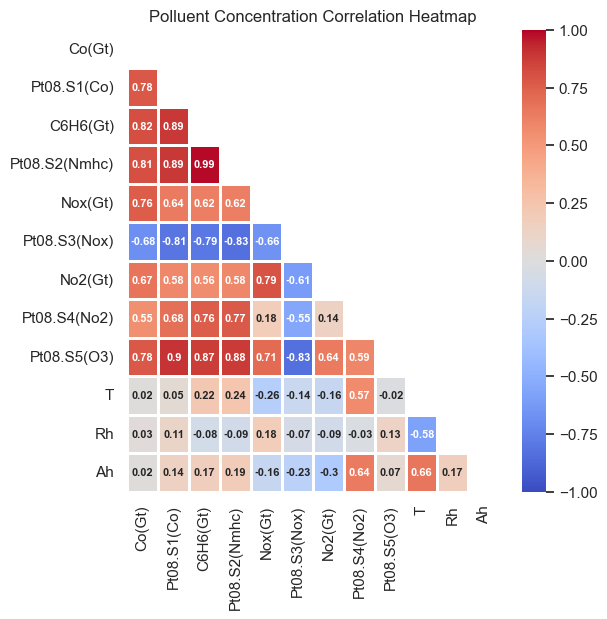

In [46]:
corrMat(df_num)

The following are the main insights from the correlation matrix, focusing on features that are highly correlated with **PT08.S1 (CO)**, our target variable representing carbon monoxide concentration in the atmosphere.

### Key Correlations with PT08.S1 (CO)
- **PT08.S5 (O3)**: This variable has the strongest positive correlation with PT08.S1 (CO), with a correlation coefficient of **0.90**. This suggests a strong linear relationship between ozone levels and carbon monoxide concentrations.
- **PT08.S2 (NMHC)**: The next highest correlation is with **PT08.S2 (NMHC)**, which has a coefficient of **0.89**, indicating a strong positive association between non-methane hydrocarbons and CO levels.
- **C6H6 (Benzene)**: Benzene concentration is also highly correlated with PT08.S1 (CO), with a coefficient of **0.78**. This suggests that benzene levels rise alongside carbon monoxide concentrations.
- **NOx (GT)**: Nitrogen oxides (NOx) show a moderately positive correlation with PT08.S1 (CO) at **0.63**, implying a significant, though weaker, relationship with CO concentrations.

### Negative Correlations
- **PT08.S3 (NOx)**: Interestingly, this variable, another NOx sensor, has a negative correlation of **-0.81** with PT08.S1 (CO). This inverse relationship may indicate that this specific sensor measures a different aspect of NOx that does not track CO in the same way.
  
### Low Correlations
- **Temperature (T)** and **Relative Humidity (RH)**: These environmental variables show only weak correlations with PT08.S1 (CO) (**0.06** and **0.11**, respectively), suggesting they are not major contributors to the variability in CO levels.

### Multicollinearity in the Data
Multicollinearity refers to a situation where predictor variables are highly correlated with each other, which can lead to redundancy and affect the performance of regression models by inflating standard errors and making it difficult to assess the importance of individual predictors. In our dataset, we observe high correlations between several independent variables, such as:
- **PT08.S5 (O3)** and **PT08.S2 (NMHC)**: Correlation of **0.88**
- **PT08.S2 (NMHC)** and **C6H6 (Benzene)**: Correlation of **0.86**
- **PT08.S4 (NO2)** and **PT08.S2 (NMHC)**: Correlation of **0.77**

These high correlations between the predictors indicate potential multicollinearity issues. When predictors are highly collinear, it becomes challenging to distinguish the independent effect of each feature on the target variable.

### Need for Dimensionality Reduction
Given the high correlations between certain features, dimensionality reduction techniques such as **Principal Component Analysis (PCA)** can be useful to reduce the redundancy in the data and avoid feeding highly correlated variables into the model. This will allow us to:
- Capture the essential patterns and relationships in the data
- Prevent the model from becoming overly complex or overfitting due to multicollinearity
- Ensure that each feature contributes meaningfully to the prediction of **PT08.S1 (CO)**

By applying dimensionality reduction, we can create a more robust and interpretable regression model that avoids redundancy and improves performance.

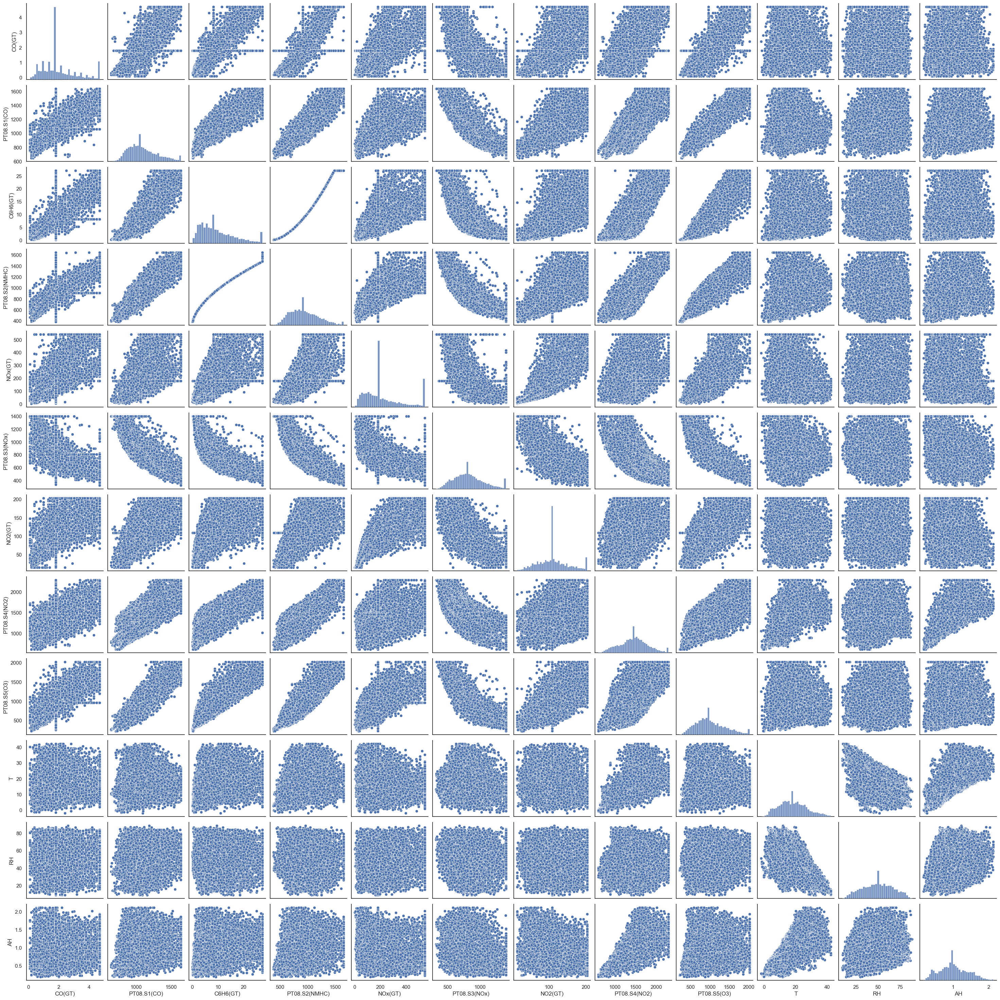

In [47]:
sns.pairplot(df_num)
plt.show()

By analyzing the pairplot of our variables, we observe a mix of both linear and non-linear relationships between features. These insights are critical in shaping our approach to regression modeling.

## 4. Question 1: **When** are polluent concentrations highest?

   ##### - Specifically, where the CO concentrations are the highest? 
   ##### - This includes analyzing the hours, days, weeks, and months of the year with the highest recorded concentrations of CO.

In [48]:
df_full.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'Date', 'Time'],
      dtype='object')

## 4.1. Visualization through calendar heatmap

In [49]:
def calendar_heatmap(df, pollutant_column, save_dir=None):
    """
    Generate a calendar heatmap for the specified pollutant column, with mean pollutant concentration per day.
    
    Parameters:
    df (pandas.DataFrame): The input DataFrame.
    pollutant_column (str): The name of the pollutant column to generate the calendar heatmap for.
    save_dir (str): Optional. Directory where the figure should be saved. If None, the figure is only displayed.
    
    Returns:
    Saves the calendar heatmap as an image and/or displays it.
    """

    # Ensure 'Date' is in datetime format
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

    # Extract year, month, day, and weekday
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month
    df['Day'] = df['Date'].dt.day
    df['Weekday'] = df['Date'].dt.weekday

    # Compute daily means
    daily_means = df.groupby(['Year', 'Month', 'Day'])[pollutant_column].mean().reset_index()
    daily_means.columns = ['Year', 'Month', 'Day', 'MeanPollutant']

    # Get unique years for subplots
    years = daily_means['Year'].unique()
    num_years = len(years)

    # Set up subplots
    fig, axs = plt.subplots(1, num_years, figsize=(20, 5), constrained_layout=True)

    # Loop through each year and generate heatmap
    for i, year in enumerate(years):
        year_data = daily_means[daily_means['Year'] == year]

        # Create pivot table for heatmap
        pivot_table = year_data.pivot_table(index='Month', columns='Day', values='MeanPollutant')

        # Handle months with fewer than 31 days by filling with NaN
        pivot_table = pivot_table.reindex(index=np.arange(1, 13), columns=np.arange(1, 32))
        
        # Replace numerical month values with month abbreviations
        pivot_table.index = pivot_table.index.map(lambda x: calendar.month_abbr[x])

        # Generate heatmap
        sns.heatmap(pivot_table, cmap='RdYlGn_r', ax=axs[i], linewidths=0.5, linecolor='grey',
                    cbar_kws={'label': 'Pollutant Concentration'})
        axs[i].set_title(f'Year: {year}', fontsize=12)
        axs[i].set_xlabel('Day', fontsize=10)
        axs[i].set_ylabel('Month', fontsize=10)

    # Set global title
    plt.suptitle(f'Calendar Heatmap of {pollutant_column} Concentrations', fontsize=16)

    # Save the figure if the save_dir is provided
    if save_dir:
        # Ensure the directory exists
        os.makedirs(save_dir, exist_ok=True)
        
        # Create the filename based on the pollutant
        file_path = os.path.join(save_dir, f'calendar_heatmap_{pollutant_column}.png')
        
        # Save the figure
        plt.savefig(file_path, bbox_inches='tight', dpi=300)
        print(f"Figure saved at: {file_path}")
    
    # Show the plot
    plt.show()


Figure saved at: ..\EDA_results\figures\calendar_heatmap_PT08.S1(CO).png


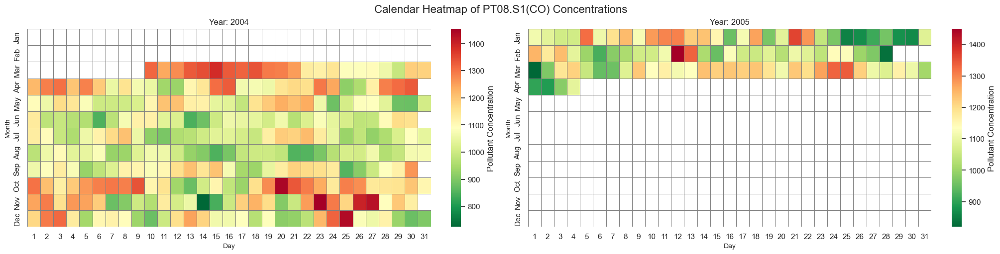

In [50]:
target_dir = os.path.join(os.pardir, "EDA_results", "figures")
calendar_heatmap(df_full, 'PT08.S1(CO)', save_dir=target_dir)

### Insights from Calendar Visualization

By visually inspecting the calendar for both 2004 and 2005, a few key insights about CO² pollution levels emerge:

- **March Patterns**: Both years show a concentration of high CO² pollution during the second to third weeks of March.
- **Notable Spikes**:
  - The **highest recorded CO² levels** appear at the end of November 2004.
  - There are also **significant peaks** observed in mid-February, and towards the end of both October and December 2004.
  
These observations suggest certain periods of the year may experience higher pollution levels, which could be influenced by seasonal or environmental factors, we will explore this further later

#### 4.2. Visualization by plotting pollutants variation through time 

In [51]:
def plot_pollutant_variations(df, pollutants, ylabel='Concentration', save_dir=None):
    """
    Plots pollutant concentration variations by hour, month, and day of the week for multiple pollutants,
    highlighting the peak values in each variation (hourly, monthly, weekly).
    
    Parameters:
    df (DataFrame): Input DataFrame containing pollutant data.
    pollutants (list): List of pollutant column names to plot.
    ylabel (str, optional): Y-axis label. Default is 'Concentration'.
    save_dir (str, optional): Directory where the figure should be saved. If None, figures are only displayed.
    """
    
    # Ensure correct datetime parsing
    df['Time'] = pd.to_datetime(df['Time'], format='%H.%M.%S', errors='coerce')
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

    # Convert pollutant columns to numeric
    for pollutant in pollutants:
        df[pollutant] = pd.to_numeric(df[pollutant], errors='coerce')

    # Drop rows with missing values
    df = df[['Time', 'Date'] + pollutants].dropna()

    # Color palette for the pollutants
    colors = sns.color_palette("husl", len(pollutants))

    # Loop through each pollutant to generate plots
    for idx, pollutant in enumerate(pollutants):
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))
        fig.suptitle(f'Pollutant: {pollutant}', fontsize=20)

        # Hourly Variation
        df['Hour'] = df['Time'].dt.hour
        hourly_data = df.groupby('Hour')[pollutant].agg(['mean', 'std']).reset_index()
        axes[0].plot(hourly_data['Hour'], hourly_data['mean'], color=colors[idx], linewidth=2)
        axes[0].fill_between(hourly_data['Hour'], 
                             hourly_data['mean'] - hourly_data['std'], 
                             hourly_data['mean'] + hourly_data['std'], 
                             color=colors[idx], alpha=0.3)
        axes[0].set_title('Hourly Variation', fontsize=16)
        axes[0].set_xlabel('Hour', fontsize=14)
        axes[0].set_ylabel(ylabel, fontsize=14)
        axes[0].set_xticks(np.arange(0, 24, 1))

        # Add vline at peak hour (maximum concentration)
        peak_hour = hourly_data.loc[hourly_data['mean'].idxmax(), 'Hour']
        axes[0].axvline(x=peak_hour, color='red', linestyle='--', label='Peak Hour')
        axes[0].legend()

        # Monthly Variation
        df['Month'] = df['Date'].dt.month
        month_data = df.groupby('Month')[pollutant].agg(['mean', 'std']).reset_index()
        axes[1].plot(month_data['Month'], month_data['mean'], color=colors[idx], linewidth=2)
        axes[1].fill_between(month_data['Month'], 
                             month_data['mean'] - month_data['std'], 
                             month_data['mean'] + month_data['std'], 
                             color=colors[idx], alpha=0.3)
        axes[1].set_title('Monthly Variation', fontsize=16)
        axes[1].set_xlabel('Month', fontsize=14)
        axes[1].set_xticks(np.arange(1, 13, 1))
        axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], fontsize=12)

        # Add vline at peak month (maximum concentration)
        peak_month = month_data.loc[month_data['mean'].idxmax(), 'Month']
        axes[1].axvline(x=peak_month, color='red', linestyle='--', label='Peak Month')
        axes[1].legend()

        # Weekly Variation
        df['DayOfWeek'] = df['Date'].dt.dayofweek
        week_data = df.groupby('DayOfWeek')[pollutant].agg(['mean', 'std']).reset_index()
        axes[2].plot(week_data['DayOfWeek'], week_data['mean'], color=colors[idx], linewidth=2)
        axes[2].fill_between(week_data['DayOfWeek'], 
                             week_data['mean'] - week_data['std'], 
                             week_data['mean'] + week_data['std'], 
                             color=colors[idx], alpha=0.3)
        axes[2].set_title('Weekly Variation', fontsize=16)
        axes[2].set_xlabel('Day of Week', fontsize=14)
        axes[2].set_xticks(np.arange(0, 7, 1))
        axes[2].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], fontsize=12)

        # Add vline at peak day of the week (maximum concentration)
        peak_day = week_data.loc[week_data['mean'].idxmax(), 'DayOfWeek']
        axes[2].axvline(x=peak_day, color='red', linestyle='--', label='Peak Day')
        axes[2].legend()

        # Adjust layout and show plot
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])

        # Save the figure if save_dir is provided
        if save_dir:
            # Ensure the directory exists
            os.makedirs(save_dir, exist_ok=True)
            
            # Define the file path
            file_path = os.path.join(save_dir, f'{pollutant}_variation.png')
            
            # Save the figure
            plt.savefig(file_path, bbox_inches='tight', dpi=300)
            print(f"Figure saved at: {file_path}")

        # Show the figure
        plt.show()

### How to Use the `plot_pollutant_variations` Function

The function `plot_pollutant_variations` is designed to visualize how pollutant concentrations vary by hour, month, and day of the week. It highlights the peak concentrations across these dimensions to provide insights into when pollutants are most concentrated.

To use this function, pass your DataFrame containing pollutant data and specify which pollutants you want to analyze. Here's an example:

In [52]:
polluent_list = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

Figure saved at: ..\EDA_results\figures\CO(GT)_variation.png


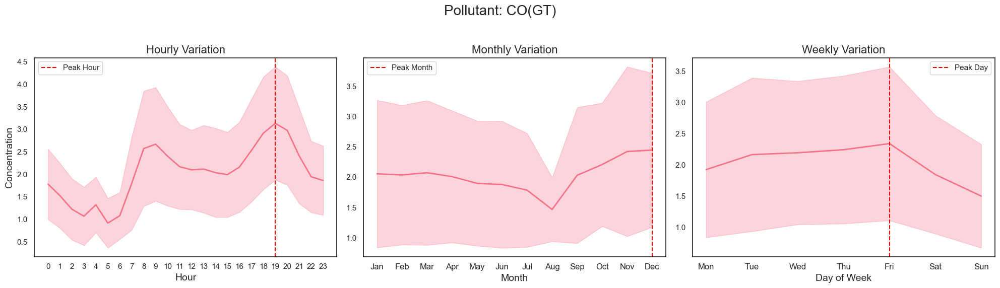

Figure saved at: ..\EDA_results\figures\PT08.S1(CO)_variation.png


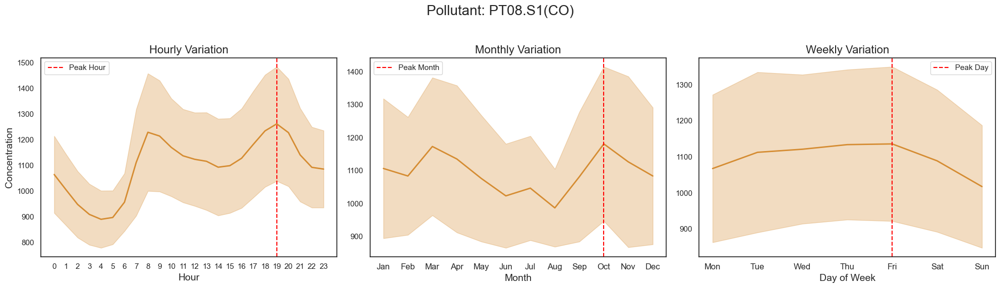

Figure saved at: ..\EDA_results\figures\C6H6(GT)_variation.png


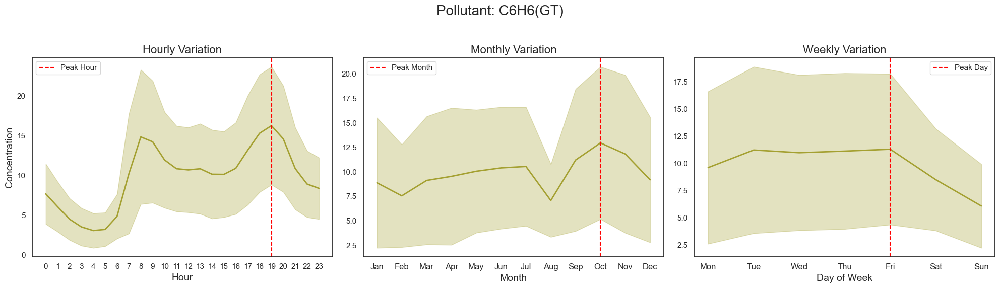

Figure saved at: ..\EDA_results\figures\PT08.S2(NMHC)_variation.png


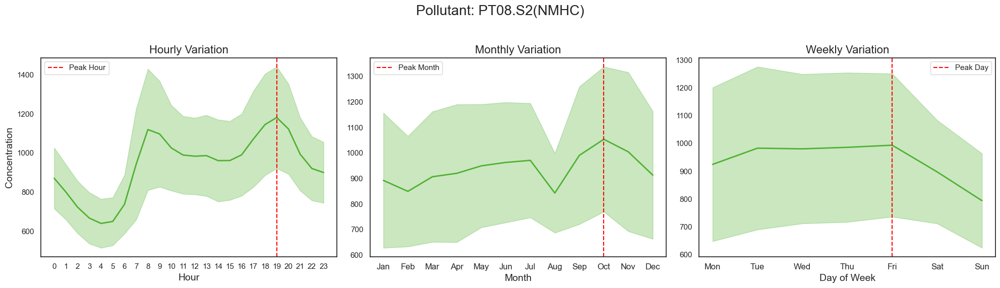

Figure saved at: ..\EDA_results\figures\NOx(GT)_variation.png


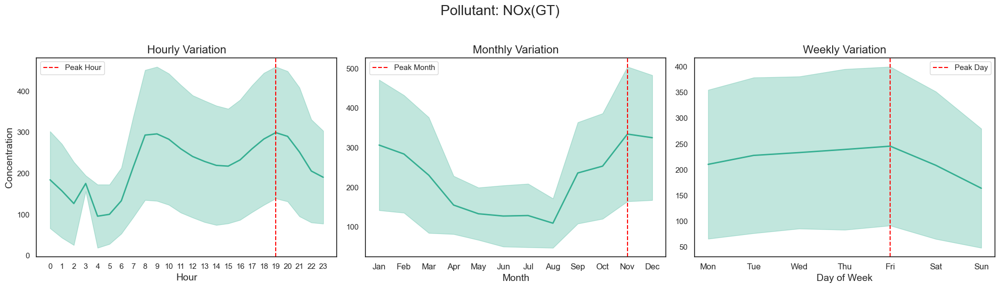

Figure saved at: ..\EDA_results\figures\PT08.S3(NOx)_variation.png


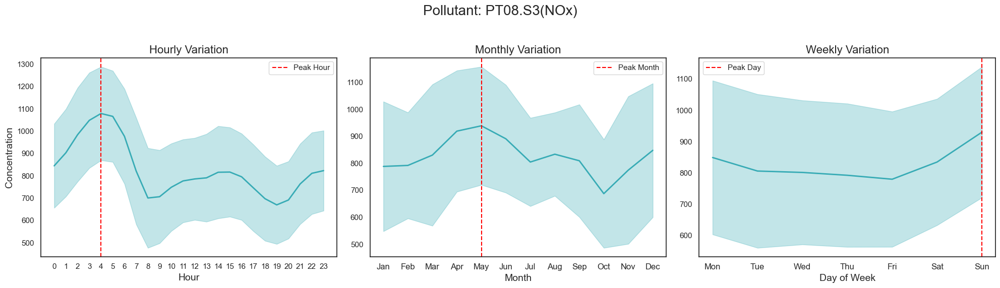

Figure saved at: ..\EDA_results\figures\NO2(GT)_variation.png


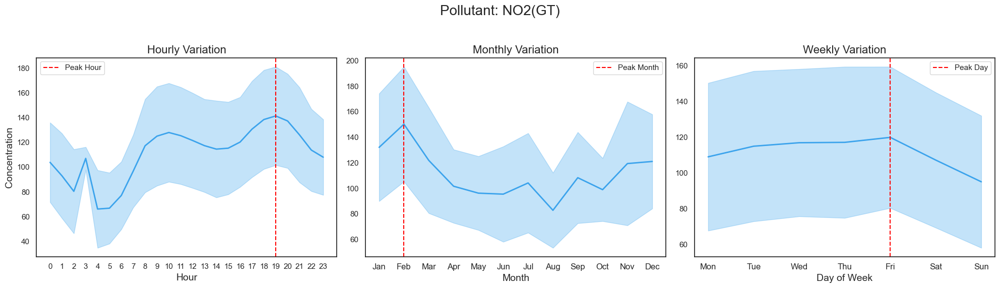

Figure saved at: ..\EDA_results\figures\PT08.S4(NO2)_variation.png


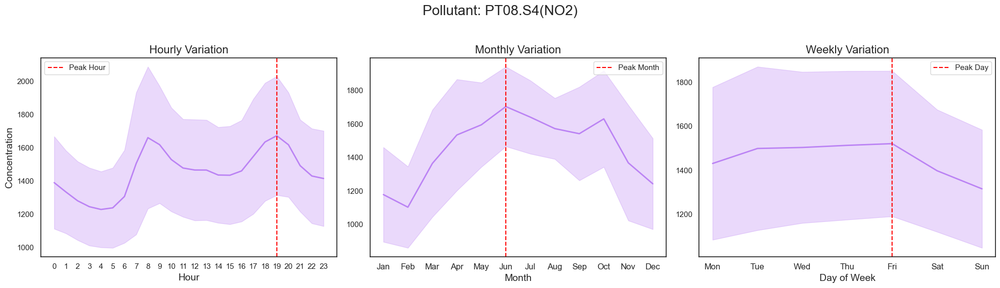

Figure saved at: ..\EDA_results\figures\PT08.S5(O3)_variation.png


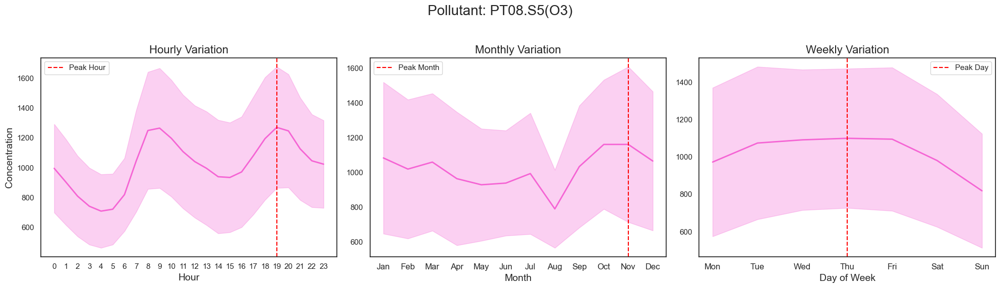

In [53]:
plot_pollutant_variations(df_full, polluent_list, save_dir = target_dir)

## Pollutant Concentration Insights

- **NMHC(GT)**: 
  - **Hour**: 19:00 
  - **Month**: October 
  - **Day**: Friday

- **NOx(GT)**: 
  - **Hour**: 19:00 
  - **Month**: November 
  - **Day**: Friday

- **NOx**: 
  - **Hour**: 04:00 
  - **Month**: May 
  - **Day**: Sunday-Monday

- **NO2(GT)**: 
  - **Hour**: 19:00 
  - **Month**: February 
  - **Day**: Friday

- **NO2**: 
  - **Hour**: 19:00 
  - **Month**: June 
  - **Day**: Friday

- **O3**: 
  - **Hour**: 19:00 
  - **Month**: November 
  - **Day**: Thursday

### Key Patterns:
- **19:00** is the peak hour for most pollutants, likely due to rush hour traffic.
- **November** shows high pollutant concentrations, possibly due to temperature inversions.
- **Fridays** consistently show peak pollution levels, likely from weekday activities and travel.

In [54]:
from sklearn.preprocessing import StandardScaler

## 5.1. Preparing the data for Modeling

## 5.2. Feature Scaling

In [55]:
SS = StandardScaler()

df_num_scaled = pd.DataFrame(SS.fit_transform(df_num), columns=df_num.columns)

In [56]:
df_num_scaled.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,0.502731,1.268141,0.308727,0.422874,-0.357166,0.989957,0.040987,0.712589,0.649345,-0.542647,-0.020532,-0.673431
1,-0.025409,0.940684,-0.063541,0.070297,-0.785102,1.501868,-0.471443,0.313601,-0.120701,-0.577309,-0.091228,-0.755045
2,0.150638,1.470394,-0.123104,0.008306,-0.594908,1.354368,0.065389,0.301601,0.144653,-0.739065,0.279927,-0.692634
3,0.150638,1.345190,-0.093323,0.043176,-0.316410,1.146133,0.260600,0.388599,0.480247,-0.843052,0.633408,-0.600407
4,-0.377502,0.844373,-0.495373,-0.390765,-0.594908,1.636352,0.114192,0.106607,0.238307,-0.819944,0.609842,-0.595101


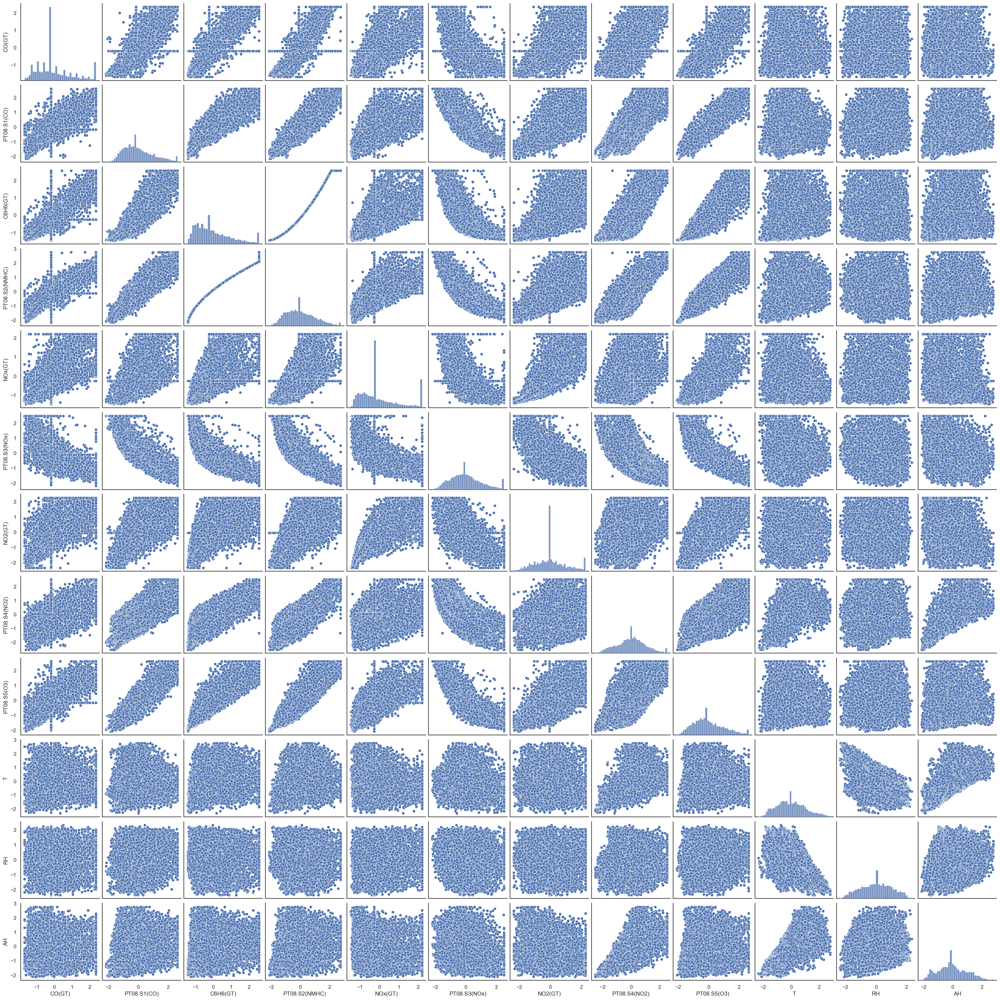

In [57]:
sns.pairplot(df_num_scaled)
plt.show()

In [58]:
target_dir = os.path.join(os.pardir, "EDA_results", "tables")

if not os.path.exists(target_dir):
    os.makedirs(target_dir)


df_num_scaled.to_csv(os.path.join(target_dir, 'df_SS.csv'), index=False)

print(f"DataFrame saved in: {os.path.abspath(target_dir)}")

DataFrame saved in: c:\Users\luizs\OneDrive\Área de Trabalho\Data Science\Data Science Portfolio\PED EDA CASES\Air Quality\EDA_results\tables


## 5.3. Applying PCA

In [59]:
X_scaled = df_num_scaled.drop(columns=['PT08.S1(CO)'])

In [60]:
X_scaled.columns

Index(['CO(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)',
       'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

In [61]:
X_scaled.head()

,CO(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,0.502731,0.308727,0.422874,-0.357166,0.989957,0.040987,0.712589,0.649345,-0.542647,-0.020532,-0.673431
1,-0.025409,-0.063541,0.070297,-0.785102,1.501868,-0.471443,0.313601,-0.120701,-0.577309,-0.091228,-0.755045
2,0.150638,-0.123104,0.008306,-0.594908,1.354368,0.065389,0.301601,0.144653,-0.739065,0.279927,-0.692634
3,0.150638,-0.093323,0.043176,-0.316410,1.146133,0.260600,0.388599,0.480247,-0.843052,0.633408,-0.600407
4,-0.377502,-0.495373,-0.390765,-0.594908,1.636352,0.114192,0.106607,0.238307,-0.819944,0.609842,-0.595101


In [62]:
target_dir = os.path.join(os.pardir, "EDA_results", "tables")

if not os.path.exists(target_dir):
    os.makedirs(target_dir)


X_scaled.to_csv(os.path.join(target_dir, 'X_scaled.csv'), index=False)

print(f"DataFrame saved in: {os.path.abspath(target_dir)}")

DataFrame saved in: c:\Users\luizs\OneDrive\Área de Trabalho\Data Science\Data Science Portfolio\PED EDA CASES\Air Quality\EDA_results\tables


In [63]:
cov_matrix = np.cov(X_scaled.T)
print(cov_matrix.shape)

(11, 11)


In [64]:
print('Covariance Matrix', cov_matrix)

Covariance Matrix [[ 1.00010688  0.81630579  0.80957675  0.75949207 -0.67963982  0.67245919
   0.54846529  0.77518951  0.02049428  0.02535247  0.02305161]
 [ 0.81630579  1.00010688  0.98837555  0.61817867 -0.79040099  0.55770302
   0.76384151  0.87480946  0.21544495 -0.07611339  0.17127551]
 [ 0.80957675  0.98837555  1.00010688  0.61868397 -0.82927108  0.57564555
   0.77333651  0.88182579  0.24500012 -0.09379928  0.18756006]
 [ 0.75949207  0.61817867  0.61868397  1.00010688 -0.65699571  0.78665582
   0.1778917   0.71257209 -0.25573548  0.18089787 -0.15970642]
 [-0.67963982 -0.79040099 -0.82927108 -0.65699571  1.00010688 -0.60583747
  -0.55125517 -0.83217349 -0.13520188 -0.06607197 -0.22972566]
 [ 0.67245919  0.55770302  0.57564555  0.78665582 -0.60583747  1.00010688
   0.14473327  0.63728111 -0.15990027 -0.09347378 -0.29825199]
 [ 0.54846529  0.76384151  0.77333651  0.1778917  -0.55125517  0.14473327
   1.00010688  0.58864686  0.56930441 -0.03457045  0.63579545]
 [ 0.77518951  0.874809

In [65]:
eig_values, eig_vectors = np.linalg.eig(cov_matrix)
print(len(eig_values))
print(eig_vectors.shape)

11
(11, 11)


In [66]:
print('Eigen Vectors:', eig_vectors)
print('Eigen Values:', eig_values)

Eigen Vectors: [[ 0.36531976  0.09403368  0.03161747 -0.04724486 -0.62085539  0.22613451
   0.59287805  0.24300561  0.02247211  0.06745495 -0.04751726]
 [ 0.39295956 -0.07133811  0.03701292 -0.32690109  0.00676247  0.05191871
  -0.18654309 -0.3117148  -0.59234214  0.47801485 -0.1348564 ]
 [ 0.39731274 -0.08248004  0.0485839  -0.26357343  0.08880113  0.02342138
  -0.10666211 -0.30018448  0.78148578  0.17159712 -0.11584886]
 [ 0.31369314  0.3128934  -0.01471613  0.41625225 -0.23877859  0.43533369
  -0.51698349 -0.16084642 -0.02473787 -0.26943875  0.13163772]
 [-0.36372802  0.00359455  0.07396791 -0.24964959 -0.64229543 -0.21865016
  -0.49577157  0.17697765  0.12050199  0.20766651 -0.06917278]
 [ 0.29003348  0.29692714  0.26368094  0.43443299 -0.0425832  -0.73893724
   0.03328699 -0.04500229 -0.00505344  0.13299601 -0.02769304]
 [ 0.28992767 -0.39310724 -0.14866048 -0.27549877 -0.20054133 -0.35969307
  -0.0503257  -0.13279699 -0.11778008 -0.58981353  0.33450462]
 [ 0.38210732  0.08051577 

In [67]:
explained_var = eig_values / np.sum(eig_values)
explained_var = np.sort(explained_var)[::-1]

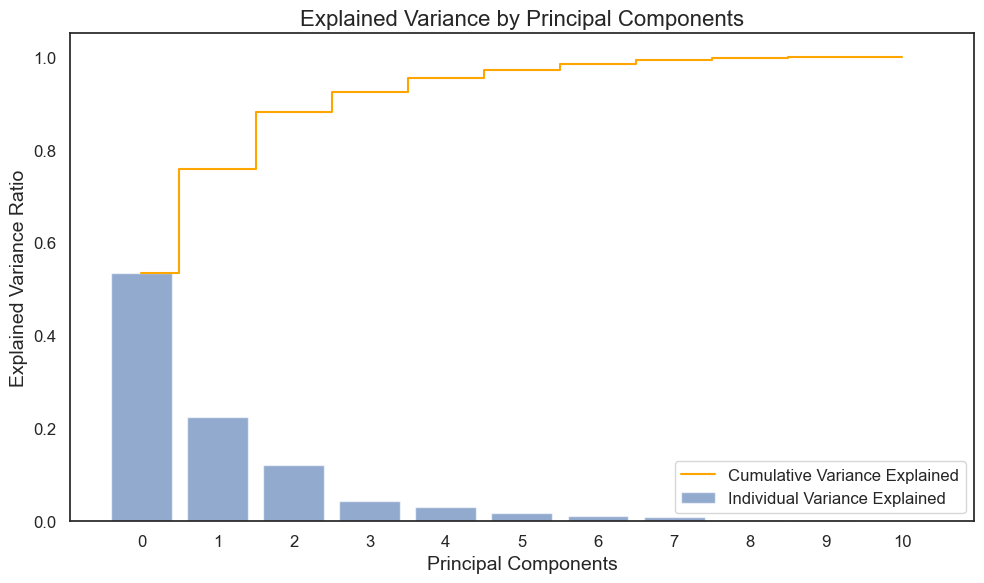

In [68]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(explained_var)), explained_var, alpha=0.6, align='center', label='Individual Variance Explained')
plt.step(range(len(explained_var)), np.cumsum(explained_var), where='mid', label='Cumulative Variance Explained', color='orange')

plt.ylabel('Explained Variance Ratio', fontsize=14)
plt.xlabel('Principal Components', fontsize=14)
plt.xticks(range(len(explained_var)), fontsize=12)
plt.yticks(fontsize=12)
plt.title('Explained Variance by Principal Components', fontsize=16)
plt.legend(loc='best', fontsize=12)
plt.tight_layout()
plt.show()

In [69]:
from sklearn.decomposition import PCA

In [70]:
pca_model = PCA(n_components = 8)
X_PCA = pca_model.fit_transform(df_num_scaled)
X_PCA.shape

(9357, 8)

In [71]:
pca_var = pca_model.explained_variance_ratio_
np.cumsum(pca_var)

array([0.56039592, 0.76658918, 0.87879492, 0.92157658, 0.95019687,
       0.96602322, 0.9770041 , 0.98604136])

In [72]:
eigen_summary_df = pd.DataFrame({
    'Eigen_Values': np.round(eig_values, 4),
    'Cumulative_Variance': np.round(np.cumsum(eig_values) / np.sum(eig_values) * 100, 4)
})

eigen_summary_df.index += 1  # Start index at 1 for better readability
eigen_summary_df.index.name = 'Principal Component'
eigen_summary_df

,Eigen_Values,Cumulative_Variance
Principal Component,,
1,5.8758,53.4102
2,2.4741,75.9000
3,1.3344,88.0295
4,0.4826,92.4162
5,0.3372,95.4815
6,0.1871,97.1822
7,0.1313,98.3757
8,0.0962,99.2503
9,0.0074,99.3171


### Explanation of the Decision

Our decision to retain four principal components is based on a balance between maximizing explained variance and preserving interpretability. Increasing the number of components may increase the cumulative variance, but it also reduces the interpretability of the model and introduces diminishing returns.

### Rationale for Retaining Four Principal Components

1. **Variance Explained**: 
   - **Principal Component 1** explains approximately **32.38%** of the total variance, capturing the direction of maximum variability in the data.
   - Collectively, the first four principal components explain **91.46%** of the total variance, indicating that these components effectively summarize the most important information in the dataset.

2. **Diminishing Returns**:
   - Beyond the fourth component, the variance explained by each additional component drops sharply. For example, the fifth component accounts for only **0.52%** of the variance.
   - Including more components adds little explanatory power, making additional components less meaningful for analysis.

3. **Interpretability**:
   - Retaining only four components simplifies the model, making it easier to interpret the results while still capturing the majority of the variance.
   - Including too many components could lead to overfitting by capturing noise rather than meaningful patterns.

### Conclusion

In conclusion, selecting **four principal components** strikes the right balance between complexity and interpretability. This decision is aligned with data science best practices for dimensionality reduction, ensuring that we capture the most important variance in the data without overfitting or losing interpretability. These components will serve as a strong foundation for further modeling and analysis.


In [73]:
PCA_4 = PCA(n_components=4)
X_PCA_4 = PCA_4.fit_transform(X_scaled)

In [74]:
PC = pd.DataFrame(X_PCA_4, columns=['PC1 PC2 PC3 PC4'.split()])
PC

,PC1,PC2,PC3,PC4
0,0.383790,-0.315427,-0.115569,-1.390634
1,-0.982753,-0.178324,-0.185674,-1.479987
2,-0.604815,-0.588733,0.076904,-1.158276
3,-0.205498,-0.808913,0.436009,-0.989135
4,-1.209343,-0.765286,0.400291,-0.890432
...,...,...,...,...
9352,2.976905,-1.199805,-1.676375,0.999587
9353,1.537185,-0.718087,-2.136701,1.013514
9354,1.306364,-0.381175,-2.591672,0.821266
9355,-0.038337,-0.338591,-3.029289,0.821676


In [75]:
cols = X_scaled.columns

In [76]:
cols

Index(['CO(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)',
       'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

In [77]:
PC_variables = pd.DataFrame(PCA_4.components_.T, columns = ['PC_'+str(i) for i in range(1,5)], index = cols)

In [78]:
PC_variables

,PC_1,PC_2,PC_3,PC_4
CO(GT),0.365320,-0.094034,-0.031617,-0.047245
C6H6(GT),0.392960,0.071338,-0.037013,-0.326901
PT08.S2(NMHC),0.397313,0.082480,-0.048584,-0.263573
NOx(GT),0.313693,-0.312893,0.014716,0.416252
PT08.S3(NOx),-0.363728,-0.003595,-0.073968,-0.249650
NO2(GT),0.290033,-0.296927,-0.263681,0.434433
PT08.S4(NO2),0.289928,0.393107,0.148660,-0.275499
PT08.S5(O3),0.382107,-0.080516,0.089085,-0.179762
T,0.064433,0.572985,-0.271490,0.304555
RH,0.001738,-0.213051,0.807495,0.029879


In [79]:
explained_variance_df = pd.DataFrame({
    'Principal Component': [f'PC_{i+1}' for i in range(len(PCA_4.explained_variance_ratio_))],
    'Explained Variance (%)': PCA_4.explained_variance_ratio_ * 100
})

print(explained_variance_df)

  Principal Component  Explained Variance (%)
0                PC_1               53.410220
1                PC_2               22.489824
2                PC_3               12.129432
3                PC_4                4.386693


In [80]:
PCA_4 = PCA(n_components=4)
X_PCA_4 = PCA_4.fit_transform(X_scaled)

# Create DataFrame for PCA results
PC = pd.DataFrame(X_PCA_4, columns=['PC1', 'PC2', 'PC3', 'PC4'])

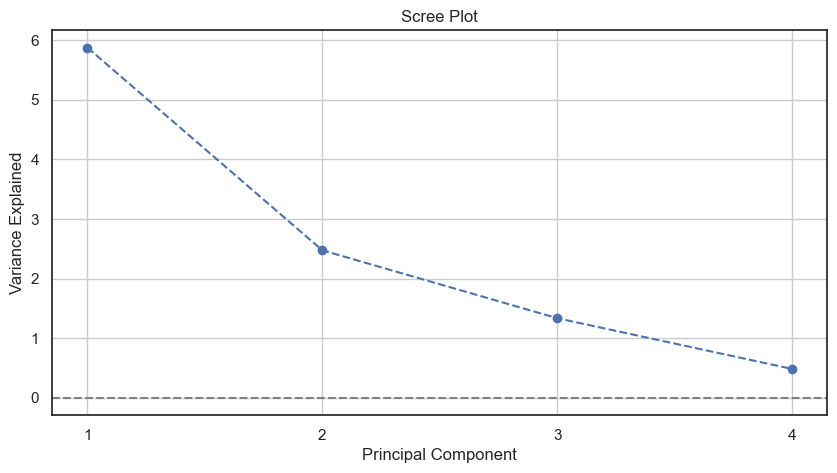

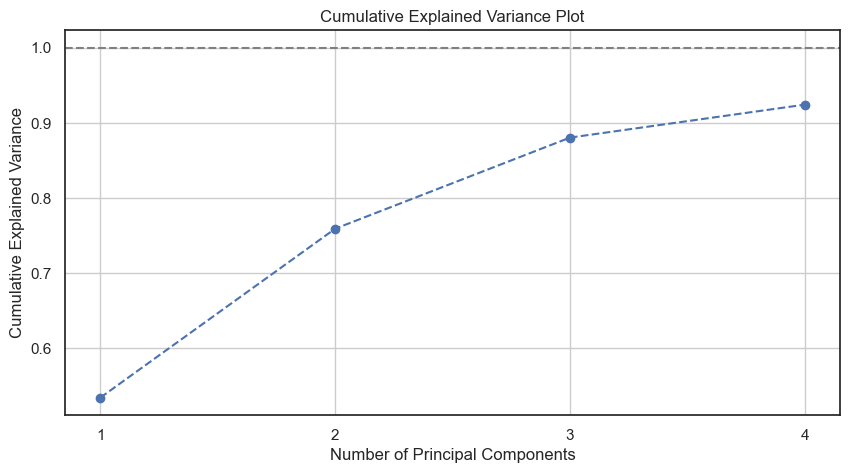

In [81]:
# Scree Plot
plt.figure(figsize=(10, 5))
plt.plot(range(1, 5), PCA_4.explained_variance_, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.xticks(range(1, 5))
plt.axhline(y=0, color='grey', linestyle='--')
plt.grid()
plt.show()

# Cumulative Variance Plot
cumulative_variance = PCA_4.explained_variance_ratio_.cumsum()
plt.figure(figsize=(10, 5))
plt.plot(range(1, 5), cumulative_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, 5))
plt.axhline(y=1, color='grey', linestyle='--')
plt.grid()
plt.show()

## 5.4. Feature Contributions to Principal Components: A Factor Analysis

In [82]:
loadings = pd.DataFrame(
    PCA_4.components_.T * np.sqrt(PCA_4.explained_variance_),  
    index=X_scaled.columns, 
    columns=['PC1', 'PC2', 'PC3', 'PC4']  
)

In [83]:
component_names = [
    "Overall Pollutant Concentration (PC1)",
    "Temperature and Humidity vs. Nitrogen Oxides (PC2)",
    "Relative Humidity (PC3)",
    "Nitrogen Oxides and Temperature (PC4)"
]


loadings.columns = component_names


loadings = loadings.round(2)


loadings.head()

,Overall Pollutant Concentration (PC1),Temperature and Humidity vs. Nitrogen Oxides (PC2),Relative Humidity (PC3),Nitrogen Oxides and Temperature (PC4)
CO(GT),0.89,-0.15,-0.04,-0.03
C6H6(GT),0.95,0.11,-0.04,-0.23
PT08.S2(NMHC),0.96,0.13,-0.06,-0.18
NOx(GT),0.76,-0.49,0.02,0.29
PT08.S3(NOx),-0.88,-0.01,-0.09,-0.17


### **Insights on Principal Components:**

By analyzing the PCA loadings, we can assign meaningful interpretations to the principal components (PCs), allowing us to gain insight into the underlying structure of the data. This interpretation is crucial for understanding which variables influence each component and how the reduction in dimensionality improves interpretability without sacrificing too much variance.

#### **PC1: Overall Pollutant Concentration**
- **Explanation**: This component was named "Overall Pollutant Concentration" because it captures a broad measure of air pollutants, driven by multiple volatile organic compounds.
- **Key Variables**:
  - **PT08.S2(NMHC)** has the highest loading, indicating a significant contribution to this component, reflecting concentrations of organic air pollutants.
  - **C6H6(GT)** and **PT08.S5(O3)** also contribute positively, reinforcing that this component encapsulates a wide range of pollutants.
  
The high cumulative variance captured by PC1 (~32.38%) justifies this interpretation, as it represents the direction of maximum variance related to overall pollutant levels in the dataset.

#### **PC2: Temperature and Humidity vs. Nitrogen Oxides**
- **Explanation**: PC2 highlights the contrast between temperature and humidity effects and nitrogen oxide levels, hence the name "Temperature and Humidity vs. Nitrogen Oxides."
- **Key Variables**:
  - **T** (temperature) and **AH** (absolute humidity) contribute strongly to this component, representing atmospheric conditions.
  - **NOx(GT)** has a notable negative loading, indicating an inverse relationship with temperature and humidity.
  
This component captures an important interaction between environmental factors and pollutants, and its interpretation aligns with the trade-off between explaining additional variance and maintaining simplicity.

#### **PC3: Relative Humidity**
- **Explanation**: PC3 is dominated by **RH** (relative humidity), suggesting this component mainly reflects moisture levels in the atmosphere, which is why it was named "Relative Humidity."
- **Key Variables**:
  - **RH** has a very high positive loading, indicating it is the primary driver of this component.
  - **T** contributes negatively, suggesting a relationship between temperature and humidity.
  
Choosing this PC adds interpretability related to meteorological effects, which are essential for understanding air quality variations driven by humidity levels.

#### **PC4: Nitrogen Oxides and Temperature**
- **Explanation**: The fourth component highlights contributions from nitrogen oxide variables, **NO2(GT)** and **PT08.S4(NO2)**, with temperature also playing a role. This led to the name "Nitrogen Oxides and Temperature."
- **Key Variables**:
  - **NO2(GT)** and **PT08.S4(NO2)** exhibit significant loadings, representing nitrogen oxide pollution.
  - The negative loading of **PT08.S4(NO2)** suggests an inverse effect within this component.

By including PC4, we capture specific pollution patterns related to nitrogen oxides, which are crucial for air quality studies, enhancing interpretability while explaining additional variance (~91.46% cumulative).

---

### Conclusion: Balancing Variance and Interpretability

In selecting four principal components, we strike a balance between maximizing the variance explained (~91.46%) and maintaining interpretability. Each component reflects a distinct aspect of the dataset:
- PC1 emphasizes general pollutant concentration.
- PC2 captures environmental conditions.
- PC3 isolates humidity effects.
- PC4 focuses on nitrogen oxides.

This approach avoids overfitting and ensures that the results remain interpretable, enabling us to draw meaningful conclusions about air quality dynamics. Each principal component represents a different dimension of variability, allowing for a clearer understanding of the relationships between pollutants and environmental factors.

In [84]:
pca_df = pd.DataFrame(X_PCA_4, columns=['Overall Pollutant Concentration (PC1)', 'Temperature and Humidity vs. Nitrogen Oxides (PC2)', 'Relative Humidity (PC3)', 'Nitrogen Oxides and Temperature (PC4)'])

In [85]:
pca_df.head(10)

,Overall Pollutant Concentration (PC1),Temperature and Humidity vs. Nitrogen Oxides (PC2),Relative Humidity (PC3),Nitrogen Oxides and Temperature (PC4)
0,0.383790,-0.315427,-0.115569,-1.390634
1,-0.982753,-0.178324,-0.185674,-1.479987
2,-0.604815,-0.588733,0.076904,-1.158276
3,-0.205498,-0.808913,0.436009,-0.989135
4,-1.209343,-0.765286,0.400291,-0.890432
5,-2.260189,-0.627450,0.415964,-1.021793
6,-2.980783,-0.484500,0.313116,-1.131504
7,-3.102750,-0.536181,0.510654,-1.103826
8,-3.599800,-0.453950,0.561340,-1.112339
9,-3.330099,-1.165793,0.257305,-0.058780


In [86]:
target_dir = os.path.join(os.pardir, "EDA_results", "tables")

if not os.path.exists(target_dir):
    os.makedirs(target_dir)


pca_df.to_csv(os.path.join(target_dir, 'pca_df.csv'), index=False)

print(f"DataFrame saved in: {os.path.abspath(target_dir)}")

DataFrame saved in: c:\Users\luizs\OneDrive\Área de Trabalho\Data Science\Data Science Portfolio\PED EDA CASES\Air Quality\EDA_results\tables
